# 02a The Flashlight Kernel

In [ ]:
# default_exp data_processing
from FRED.data_processing import *
!nbdev_build_lib

Converted 00 Core.ipynb.
Converted 01 Datasets.ipynb.
Converted 01a01 Graph Toy Datasets.ipynb.
Converted 01a01a Communities Datasets.ipynb.
Converted 01a01b Small Random Directed Graphs.ipynb.
Converted 01a01c Directed Stochastic Block Model.ipynb.
Converted 01a02 Manifold Toy Datasets.ipynb.
Converted 01a02a Polar 1-Manifold Toy Datasets.ipynb.
Converted 01a02b Polar 2-Manifold Toy Datasets.ipynb.
Converted 01a02c Function 1-Manifold Toy Datasets.ipynb.
Converted 01a02d Sphere and Torus Toy Datasets.ipynb.
Converted 01a02e Flow Critical Datasets.ipynb.
Converted 01b01 Synthetic Single-Cell Data.ipynb.
Converted 01b02 Single-Cell Data and RNA Velocity.ipynb.
Converted 01c Plotting Utils.ipynb.
Converted 02 Data Preprocessing.ipynb.
Converted 02a Flashlight Kernel.ipynb.
Converted 02b Diffusion Maps and Distances.ipynb.
Converted 02b01 Symmetrized Flow-based Diffusion Map.ipynb.
Converted 02c Flow Neighborhoods.ipynb.
Converted 02d Flow Datasets.ipynb.
Converted 02e Edge to Edge Earth 

FRED at its core is a diffusion-based model; It embeds directed graphs and high dimensional data into euclidean space with a vector field in terms of probabilities, rather than distances. The Flashlight Kernel is a basis of FRED as it translates points and vectors and points in euclidean space with a vector field into affinities between directed graph nodes.

---

## The Flashlight Kernel

$$k(x_i,x_j) = \exp\left[\frac{-\left(||x_j - x_i||_2 + \beta \cdot \left(||v_i||_2 - \left\langle v_i, \frac{x_j - x_i}{||x_j - x_i||_2}\right\rangle \right)\right)}{\sigma}\right],$$

where $k(x_i,x_j)$ is the affinity from $x_i$ to $x_j$, $v_i$ is the flow at $x_i$ (vector associated with data point in ambient space or vector at point $x_i$ in embedding space with a vector field), and $||\cdot||_2$ is the regular two-norm. $\beta$ and $\sigma$ are tunable hyperparameters, which controls the emphasis or "strength" of flow relative to distance in the calculation of affinities between two points.

---

The Flashlight Kernel shows up in various parts of all iterations and implementations of FRED including but not limited to converting high dimensional input data (data clouds with vectors associated to each data points such as RNA Velocity data) into directed graphs with affinities, converting points in our embedding space (euclidean space with a vector field) into directed graphs with affinities, calculating near neighbors of data points in the ambient space, and more.

The essence of the Flashlight Kernel is to retain asymmetric relationships between data points with directionality similar to that of directed graph nodes. It assigns affinities between two data points by considering both the distance between them and their associated vectors; Going with the flow is highly encouraged and going against or even perpendicular to the flow is discouraged and assigned affinity close to zero. As a result, diffusion or random walks probabilities from data point to data point is heavily dictated by the flow in the embedding space or vectors associated with data points in embient space.

Note that affinities between data points can be (and almost always are) asymmetric i.e., $k(x_i, x_j) \neq k(x_j, x_i)$ as the flow at $x_i$ may be pointing towards $x_j$, but the opposite may not be true. In fact, in single-cell data, this is rarely true as cells do not transition back and forth between two different states.

---

## The Algorithm

$\textbf{Affinity from flow}$

Input:
- F: $n \times d$ tensor with $n$ rows of points each with flow in $d$  column directions
- D: $n \times n \times d$ tensor where dimension 1 represents directions to point i, dimension 2 represents direction from point j, and dimension 3 represents the displacement from point j to point i in each dimension of ($\mathbb{R}^d$). Ex. directions_array\[i\]\[j\] is the vector from point $x_j$ to point $x_i$ i.e., $(x_j - x_i)$.
- b: flow strength ($\beta$)
- s: bandwidth ($\sigma$)

Algorithm:
1. Calculate length of direction vectors, $L$ ($n \times n$).
2. Calculate normalized directions tensor from $D$, $D_n$ (n \times n \times d).
3. Compute dot product between normed directions and flows (Sum $d$ dimensions of $D_nF$ = $C_F$ (cost from flow)).
4. Subtract $C_F$ from length of flows in $F$ ($F_F$, flow factor).
5. Take absoluate value of $F_F$.
6. Add $L$ and $s \cdot F_F$ ($C_{wF}$, cost with flow)
7. Exponentiate $C_{wF}^T$

In [ ]:
# export
import torch
import torch.nn.functional as F


def affinity_from_flow(flow, directions_array, flow_strength=1, sigma=1):
    """Compute probabilities of transition in the given directions based on the flow.

    Parameters
    ----------
    flow : torch tensor of shape n_points x n_dims
        _description_
    directions_array : torch tensor of shape n_directions x n_points x n_dims. Assumed to be normalized.
        _description_
    sigma : int, optional
        kernel bandwidth, by default 1
    returns (n_points)
    """
    assert len(flow.shape) == 2  # flow should only have one dimension
    assert len(directions_array.shape) > 1 and len(directions_array.shape) < 4
    n_directions = directions_array.shape[0]
    # Normalize directions
    length_of_directions = torch.linalg.norm(directions_array, dim=-1)
    normed_directions = F.normalize(directions_array, dim=-1)
    # and normalize flow # TODO: Perhaps reconsider
    # Calculate flow lengths, used to scale directions to flow
    # flow_lengths = torch.linalg.norm(flow,dim=-1)
    if len(directions_array) == 1:  # convert to 2d array if necessary
        directions_array = directions_array[:, None]
    # scale directions to have same norm as flow
    # scaled_directions = normed_directions * flow_lengths[:,None].repeat(directions_array.shape[0],1,directions_array.shape[2])
    # compute dot products as matrix multiplication
    dot_products = (normed_directions * flow).sum(-1)
    # take distance between flow projected onto direction and the direction
    distance_from_flow = (torch.linalg.norm(flow, dim=1)).repeat(
        n_directions, 1
    ) - dot_products
    # take absolute value
    distance_from_flow = torch.abs(distance_from_flow)
    # print('shape of dff',distance_from_flow.shape)
    # add to this the length of each direction
    distance_from_flow = flow_strength * distance_from_flow + length_of_directions
    # put the points on rows, directions in columns
    distance_from_flow = distance_from_flow.T
    # take kernel of distances
    kernel = torch.exp(-distance_from_flow / sigma)
    return kernel

In [ ]:
# export

def affinity_matrix_from_pointset_to_pointset(
    pointset1, pointset2, flow, n_neighbors=None, sigma=0.5, flow_strength=1
):
    """Compute affinity matrix between the points of pointset1 and pointset2, using the provided flow.

    Parameters
    ----------
    pointset1 : torch tensor, n1 x d
        The first pointset, to calculate affinities *from*
    pointset2 : torch tensor, n2 x d
        The second pointset, to calculate affinities *to* (from pointset1)
    flow : a function that, when called at a point, gives the flow at that point
    n_neighbors : number of neighbors to include in affinity computations. All neighbors beyond it are given affinity zero
    (currently not implemented)

    Returns:
    Affinity matrix: torch tensor of shape n1 x n2
    """

    # Calculate the directions from point i in pointset 1 to point j in pointset 2
    n1 = pointset1.shape[0]
    n2 = pointset2.shape[0]
    P2 = pointset2[:, :, None].repeat(1, 1, n1)
    P1 = pointset1.T.repeat(n2, 1, 1)
    P3 = P2 - P1
    P3 = P3.transpose(1, 2)
    # dimension 1 represents directions to point i
    # dimension 2 represents direction from point j
    # dimension 3 represents direction in each dimension (R^n)
    # compute affinities from flow and directions
    affinities = affinity_from_flow(flow, P3, sigma=sigma, flow_strength=flow_strength)

    return affinities

## Example of Flashlight Kernel in Use

In [ ]:
from FRED.datasets import directed_swiss_roll, plot_directed_3d

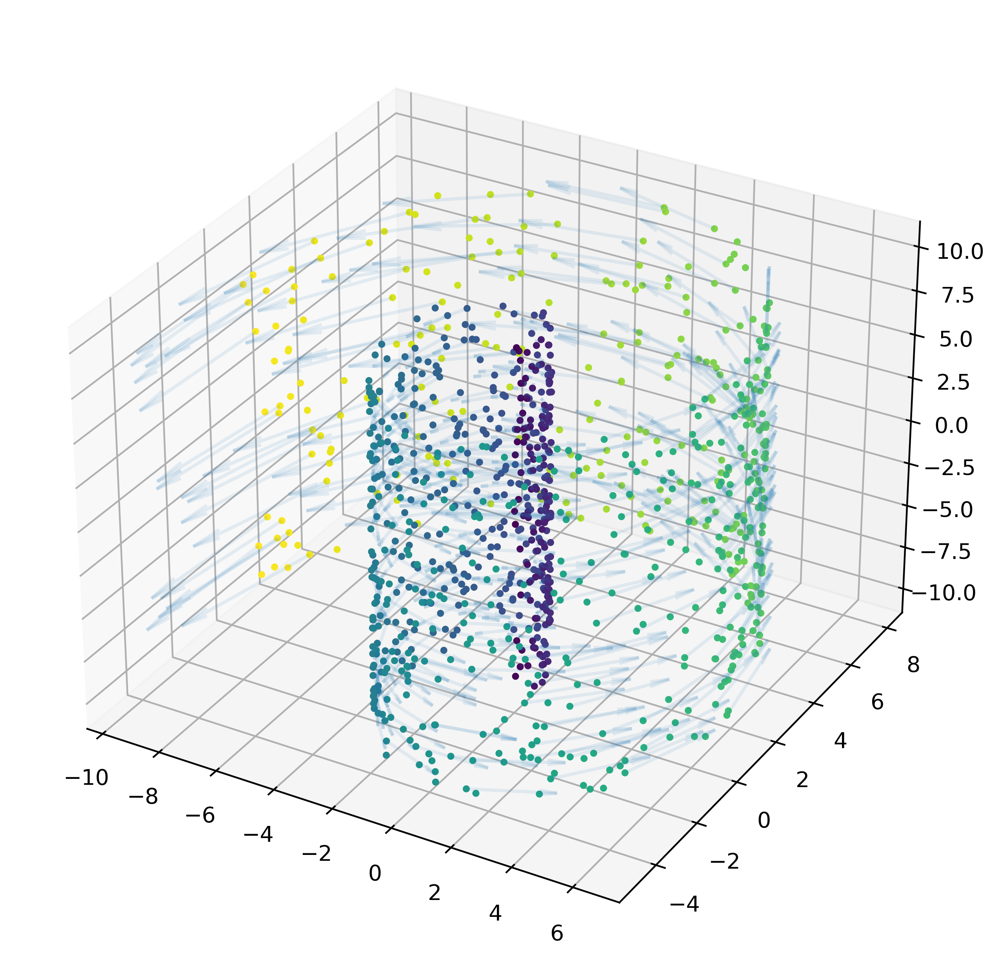

In [ ]:
X, flows, labels = directed_swiss_roll()
plot_directed_3d(X, flows, labels)

In [ ]:
print(type(X))
print(type(flows))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [ ]:
X = torch.Tensor(X)
flows = torch.Tensor(flows)
print(type(X))
print(type(flows))

<class 'torch.Tensor'>
<class 'torch.Tensor'>


In [ ]:
affinities = affinity_matrix_from_pointset_to_pointset(X, X, flows, sigma=2.5, flow_strength=1)

In [ ]:
import matplotlib.pyplot as plt

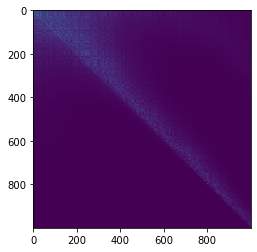

In [ ]:
plt.imshow(affinities)

## Looking for the Right $\sigma$ and $\beta$ Values

> The `affinity_grid_search` functions makes it easier to find the appropriate $\sigma$ and $\beta$ values for our flashlight kernel. The function takes in the dataset (X and flows), a list of $\sigma s$, and a list of $\beta s$ to test. THe appropriate $\sigma$ and $\beta$ values are chosen based on the affinity matrix heat maps.

In [ ]:
# export
import matplotlib.pyplot as plt

def affinity_grid_search(X,flow,sigmas, flow_strengths):
  fig, axs = plt.subplots(len(sigmas),len(flow_strengths), figsize=(len(flow_strengths*6),len(sigmas)*6))
  X = torch.tensor(X)
  flow = torch.tensor(flow)
  for i, s in enumerate(sigmas):
    for j, f in enumerate(flow_strengths):
      A = affinity_matrix_from_pointset_to_pointset(X, X, flow, sigma=s, flow_strength=f)
      A = A.numpy()
      axs[i][j].set_title(f"$\sigma = {s}$ and $f={f}$")
      axs[i][j].imshow(A)
  plt.show()

### `affinity_grad_search` in Action

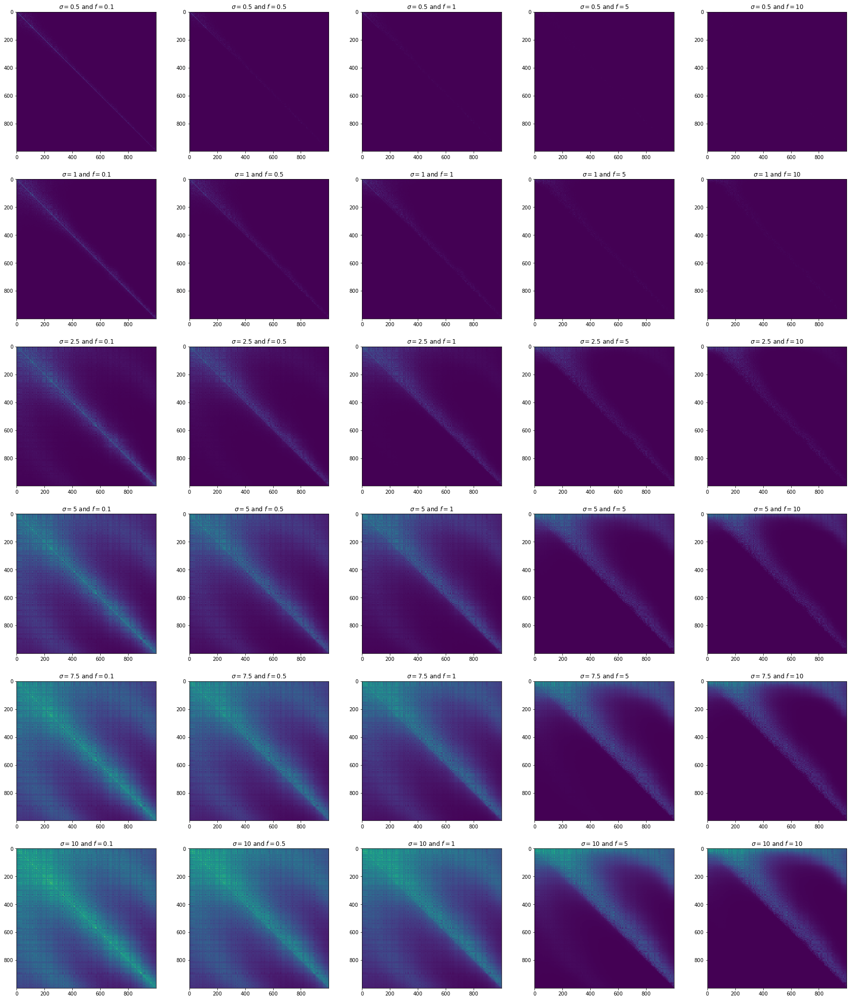

In [ ]:
sigmas = [.5,1,2.5,5,7.5,10]
flow_strengths = [.1,.5,1,5,10]

affinity_grid_search(X, flows, sigmas, flow_strengths)

# Convenience functions

The default function allows there to be multiple pointsets involve (hence the suggestive name). Here's a faster way to call it on just one pointset, with some built in bandwidth estimation (following the heuristic that sigma should be the 'median of the the distances to the kth nearest neighbor')

In [ ]:
# export
import torch
import numpy as np
def flashlight_affinity_matrix(X, flow, k=10, sigma="automatic",flow_strength= 1):
    if type(X) == torch.Tensor:
        X = X.numpy()
    Dists = distance_matrix(X)
    if sigma == "automatic":
        sigma = np.median(np.partition(Dists,k)[:,k])
        print("Set sigma = ",sigma)
    # convert back to tensors
    X = torch.Tensor(X)
    flow = torch.Tensor(flow)
    A = affinity_matrix_from_pointset_to_pointset(X, X, flow, sigma=sigma, flow_strength=flow_strength)
    return A

But let's test this heuristic before we get too far. Can it reconstruct the swiss roll?

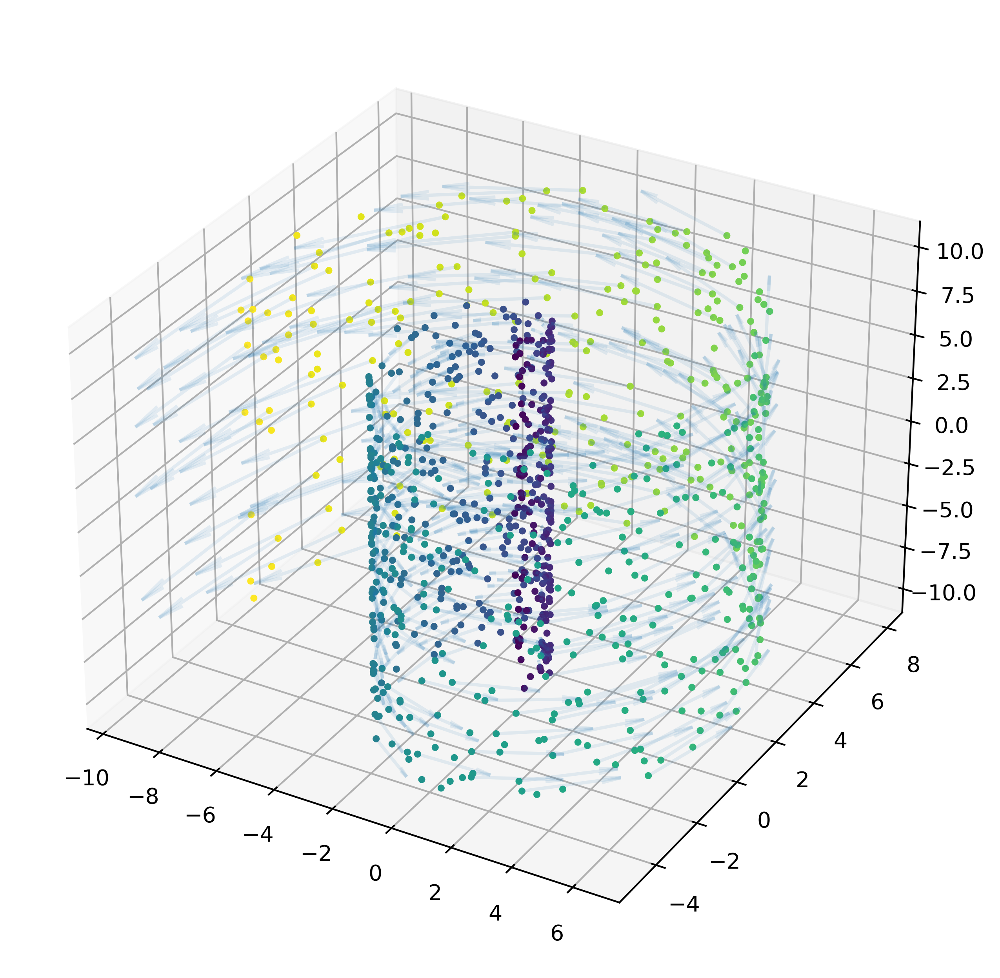

In [ ]:
from FRED.datasets import directed_swiss_roll, plot_directed_3d
X, flow, labels = directed_swiss_roll()
plot_directed_3d(X, flow, labels)

Set sigma =  1.6619502390601766


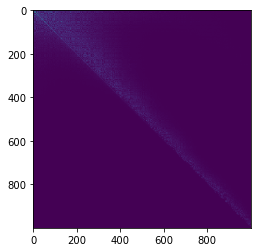

In [ ]:
A = flashlight_affinity_matrix(X, flow)
plt.imshow(A)

That does a reasonable job.

# The Flashlight Dot Product

The above kernel is very nice in euclidean 2 space, but begins to degrade in higher dimensions, in which everything is so far apart that the cosine similarity has more meaning than the euclidean distance. 

The other problem experienced by the kernel is that, because it passes everything through a negative exponential, differentiation (for purposes of backpropogation) can be difficult. The negative exponential sends most types of distant relations to something very close to zero.

Here, we develop of a variation on the canonical cosine similarity that incorporates agreement with flow information. 

In [ ]:
def pairwise_cosine_similarity_matrix(X,Y):
    assert X.shape == Y.shape
    # Calculate product of norms at each point in the matrix
    normX = torch.linalg.norm(X,dim=-1).repeat(len(X),1)
    normY = torch.linalg.norm(Y,dim=-1).repeat(len(X),1).T
    I_XY_I = normX * normY
    # Calculate matrix of products
    repeatedX = X.repeat(len(X),1,1)
    repeatedY = Y.repeat(len(Y),1,1).transpose(dim0=0,dim1=1)
    XY = repeatedX * repeatedY
    cosine_sim = XY.sum(dim=2) / I_XY_I
    return cosine_sim

def cosine_affinity_from_flow(
    X:torch.tensor, # n x d tensor of coordinates
    flow:torch.tensor, # n x d tensor of flows at each corresponding coordinate
    ):
    """ Generates a matrix of pairwise cosine affinities between the data with coordinates X and flows on coordinates"""
    # Get pairwise matrix of cosine similarities of X
    cs_X = pairwise_cosine_similarity_matrix(X,X)
    # Get directions array of xi - xj
    n1 = X.shape[0]
    n2 = X.shape[0]
    P2 = X[:, :, None].repeat(1, 1, n1)
    P1 = X.T.repeat(n2, 1, 1)
    P3 = P1 - P2
    P3 = P3.transpose(1, 2)
    # Perform dot product with flows
    flow_repeated = flow.repeat(len(X), 1, 1)
    print(flow_repeated.shape)
    print(P3.shape)
    flow_dot_directions = (flow_repeated * P3).sum(dim=2)/(torch.linalg.norm(P3, dim=2)*torch.linalg.norm(flow_repeated, dim=2))
    return flow_dot_directions + cs_X

In [ ]:
import numpy as np
flow = torch.tensor([[1,1]]).float()
x, y = np.meshgrid(np.linspace(-5,5,20),np.linspace(-5,5,20))
x = torch.tensor(x,dtype=float).cpu()
y = torch.tensor(y,dtype=float).cpu()
xy_t = torch.concat([x[:,:,None],y[:,:,None]],dim=2).float() + 10

In [ ]:
flows = flow.repeat(len(xy_t)**2,1)
flows.shape

torch.Size([400, 2])

In [ ]:
directions_array = xy_t.reshape(400,2)

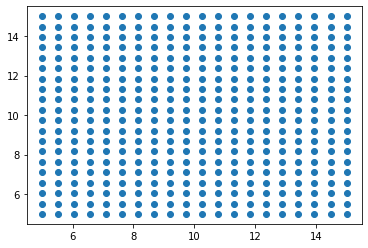

In [ ]:
plt.scatter(directions_array[:,0],directions_array[:,1])

In [ ]:
directions_array.shape

torch.Size([400, 2])

In [ ]:
affinities = cosine_affinity_from_flow(directions_array, flows)

torch.Size([400, 400, 2])
torch.Size([400, 400, 2])


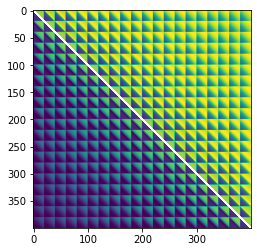

In [ ]:
import matplotlib.pyplot as plt
affinities_square = affinities.reshape(400,400)
plt.imshow(affinities_square)

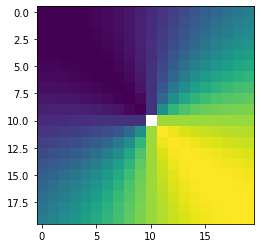

In [ ]:
affinities_square = affinities[210].reshape(20,20)
plt.imshow(affinities_square)

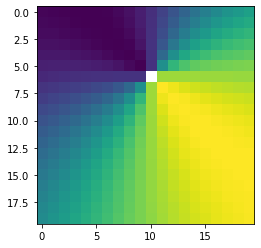

In [ ]:
affinities_square = affinities[130].reshape(20,20)
plt.imshow(affinities_square)

# A Traveling Cosine Similarity Kernel

The above works alright, but has issues with negative points. This motivates a definition which does away with the two part kernel in favor of something radically simpler: Create a local cosine affinity kernel, centered at $z_i$, between $z_j$ and $v_i$.

In [ ]:
# export
def directions_array_from(X):
    """Given n x d tensor X, returns n x n tensor where entry i,j is x_j - x_i. Useful for getting a distance matrix."""
    n1 = X.shape[0]
    P2 = X[:, :, None].repeat(1, 1, n1)
    P1 = X.T.repeat(n1, 1, 1)
    P3 = P1 - P2
    P3 = P3.transpose(1, 2)
    return P3

In [ ]:
# export
def flashlight_cosine_similarity(X, flow, directions_array = None, eps = 0.01):
    """Computes a localized cosine similarity between the direction xj - xi and the flow at xi. Ideal for use in embedding spaces."""
    # Get directions array of xj - xi
    if directions_array is not None:
        P3 = directions_array
    else:
        P3 = directions_array_from(X)
    # expand array of flows
    flows_expanded = flow.repeat(len(X),1,1).transpose(dim0=0,dim1=1)
    # get norms of each array
    norm_flows = torch.linalg.norm(flows_expanded,dim=2)
    norm_directions = torch.linalg.norm(P3,dim=2)
    # Perform dot product
    dot_prod = (P3 * flows_expanded).sum(dim=2)
    # normalize by norms
    cosine_sim = dot_prod / (torch.max(torch.tensor(eps),norm_flows * norm_directions))
    return cosine_sim

In [ ]:
affs_local_cos = flashlight_cosine_similarity(directions_array,flows)

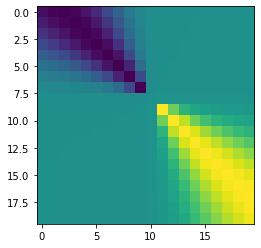

In [ ]:
affinities_square = affs_local_cos[170].reshape(20,20)
plt.imshow(affinities_square**11)

In [ ]:
torch.max(affinities_square)

tensor(1.)

Works just as expected. The kernel at every point looks the same, because it is -- it's just the dot product between the difference $x_j - x_i$ and the direction of the flow. *Notably* this kernel does not "fade with distance", as the top Flashlight Kernel does. A point obtained by following the flow for 1 second has as high affinity as a point obtained by following the flow for 10 minutes. The consolation is that in any non-uniform space, the likelihood of far away points falling within this narrow window diminishes rapidly with distance. This is even more true in high dimensions. Thus, probability plays the role previously assigned to the distance kernel.

I intend this local kernel to be used best in a *high-dimensional* embedding space, when computing the contrastive loss. It can substitute for a euclidean cosine similarity measure anywhere we'd like. 

This can be used in conjunction with a distance kernel to yield the original flashlight kernel (from above). In this setting, we want the highest resolution possible and are dealing with enough points that coincidental overlap with high distance is likely. 

Separating the kernel into these two pieces allows the distance-based kernel to be more capable, as it can be swapped out between any number of adaptive and anisotropic kernels.

In [ ]:
# export
def anisotropic_kernel(D, sigma=0.7, alpha = 1):
    """Computes anisotropic kernel of given distances matrix.

    Parameters
    ----------
    D : ndarray or sparse
    sigma : float, optional
      Kernel bandwidth, by default 0.7
    alpha : int, optional
      Degree of density normalization, from 0 to 1; by default 1
    This is a good function.
    """
    W = torch.exp(-D**2/(2*sigma**2))
    # Additional normalization step for density
    D = torch.diag(1/(torch.sum(W,dim=1)**alpha)) 
    W = D @ W @ D
    return W

In [ ]:
# export
def adaptive_anisotropic_kernel(D, k=10, alpha = 1):
    # Get the distance to the kth neighbor
    distance_to_k_neighbor = np.partition(D,k)[:,k]
    # Populate matrices with this distance for easy division. 
    div1 = np.ones(len(D))[:,None] @ distance_to_k_neighbor[None,:]
    div2 = div1.T
    # compute the gaussian kernel with an adaptive bandwidth
    W = (1/2*np.sqrt(2*np.pi))*(np.exp(-D**2/(2*div1**2))/div1 + np.exp(-D**2/(2*div2**2))/div2)
    # Additional normalization step for density
    D = np.diag(1/(np.sum(W,axis=1)**alpha)) 
    W = D @ W @ D
    return W

In [ ]:
# export
def flashlight_kernel(X, flows, kernel_type = "adaptive anisotropic", k=10, sigma = 0.7, anisotropic_density_normalization = 1, flow_strength=1):
    """A distance aware adaptation of the flashlight cosine similarity, 
    obtained by multiplying the cosine similarity by a traditional guassian kernel.
    This is not intended to be differentiable, although is with some choices of kernels (anisotropic, plain).
    """
    # send data to tensors
    X = torch.tensor(X)
    flows = torch.tensor(flows)
    # Get flashlight cosine
    DA = directions_array_from(X)
    W_cosine = flashlight_cosine_similarity(X, flows, directions_array=DA)
    # Flow strength must be an odd integer to be symmetric
    assert flow_strength == int(flow_strength) and flow_strength // 2 != flow_strength /2
    W_strengthened_cosine = W_cosine ** flow_strength
    D = torch.linalg.norm(DA, dim=-1)
    if kernel_type == "anisotropic":
        W = anisotropic_kernel(D, sigma=sigma, alpha=anisotropic_density_normalization) # works with pytorch tensors, is theoretically differentiable.
    if kernel_type == "adaptive anisotropic":
        D_np = D.numpy()
        W_np = adaptive_anisotropic_kernel(D_np, k=k, alpha = anisotropic_density_normalization)
        W = torch.tensor(W_np)
    if kernel_type == "fixed":
        W = torch.exp(-D/(sigma**2))
        W = W.fill_diagonal_(0)
    # W = W.detach()
    flashlight_K = W * ((W_strengthened_cosine+1)/2)
    return flashlight_K

Let's test this on some toy data.
I'm excited to never have to use the "affinity grid search" function again.

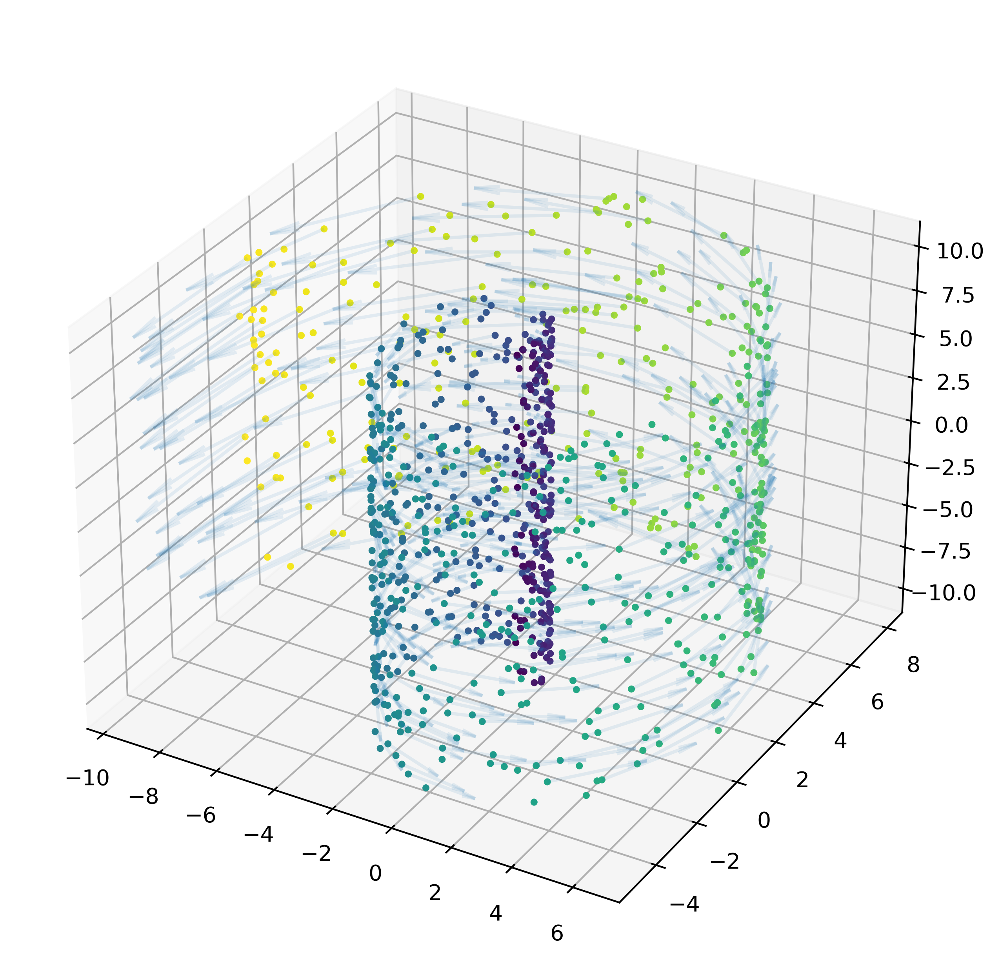

In [ ]:
from FRED.datasets import directed_swiss_roll, plot_directed_3d
X, flow, labels = directed_swiss_roll()
plot_directed_3d(X, flow, labels)

In [ ]:
A = flashlight_kernel(X,flow,kernel_type="adaptive anisotropic", k = 5, anisotropic_density_normalization=0.5)

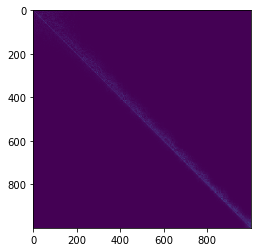

In [ ]:
plt.imshow(A)

Versus the pure gaussian affinity, which is like this but more symmetric

And the pure flashlight cosine similarity, which shows layers of cross-over between the layers of the roll.

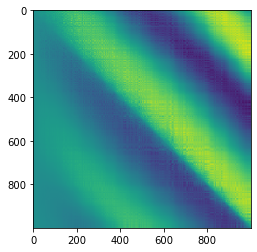

In [ ]:
X = torch.tensor(X)
flow = torch.tensor(flow)
Wk = flashlight_cosine_similarity(X,flow)
plt.imshow(Wk)

In [ ]:
import torch
I = torch.rand(5,5)
I = I.fill_diagonal_(0)

In [ ]:
I

tensor([[0.0000, 0.8948, 0.7464, 0.8563, 0.8695],
        [0.0696, 0.0000, 0.5893, 0.1752, 0.0953],
        [0.2003, 0.3221, 0.0000, 0.6291, 0.3198],
        [0.0701, 0.7875, 0.9136, 0.0000, 0.4503],
        [0.0414, 0.6608, 0.8542, 0.4327, 0.0000]])